In [1]:
# !pip install icevision[all,dev]

In [2]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

## Imports

In [3]:
from icevision.all import *
from fastai.callback.wandb import *
from fastai.callback.tracker import SaveModelCallback
import wandb
from datetime import *

In [12]:
#Download Datset 
#Uncomment on first use to download and extract dataset
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

downloaded = drive.CreateFile({'id':"1ElNqbotomwYfNJSeJlzbUfIpk1GuZ3bq"})  
downloaded.GetContentFile('WSI_PATCHES.7z') 

#Unpack zip
!p7zip -d WSI_PATCHES.7z


7-Zip (a) [64] 16.02 : Copyright (c) 1999-2016 Igor Pavlov : 2016-05-21
p7zip Version 16.02 (locale=en_US.UTF-8,Utf16=on,HugeFiles=on,64 bits,2 CPUs Intel(R) Xeon(R) CPU @ 2.20GHz (406F0),ASM,AES-NI)

Scanning the drive for archives:
  0M Scan         1 file, 57353813 bytes (55 MiB)

Extracting archive: WSI_PATCHES.7z
--
Path = WSI_PATCHES.7z
Type = 7z
Physical Size = 57353813
Headers Size = 2573
Method = LZMA2:3m
Solid = -
Blocks = 99

  0%      9% 21       Everything is Ok

Folders: 14
Files: 99
Size:       57394488
Compressed: 57353813


In [13]:
data_dir = Path('./WSI_PATCHES/Mitosis_1cls_512px_100ds')
data_dir_name = data_dir.stem

In [14]:
parser = parsers.coco(annotations_file=data_dir / "Coco.json",
                     img_dir=data_dir / 'patches',
                     mask=False)

In [15]:
#Parameters

#Class Map
# class_map = ClassMap(['unkown','mitotic figure'])
# class_map = ClassMap(['unkown','granulocyte', 'mitotic figure', 'tumor cell'])
class_map = ClassMap(['unkown','mitotic figure'])


params = dict(
    epochs=20,
    classes=len(class_map),
    class_map=class_map,
    size=512,
    size_trans=768,
    batch_size=16,
    learning_rate=3e-2,
    ds_size=500,
    run='1',
    architecture="RCNN",
    model='restnet18',
    modelclass='FastRCNN',
    infrastructure='Colab GPU'
    )
params.update(dataset="Mitosis_1Class_"+str(params['size']))
params.update(wandb_run_name = params['modelclass'] + '_' + data_dir_name + '_' + params['run'] +'_'+ date.today().strftime("%m%d%Y"))
params.update(project= 'Mitosis02')
# print(params)

size = params['size']
size_trans = params['size_trans']


In [16]:
# Records
train_records, valid_records = parser.parse()

params.update(train_ds_size=len(train_records))
params.update(valid_ds_size=len(valid_records))

INFO     - Autofixing records | icevision.parsers.parser:parse:124


### Visualization
Showing a batch of images with their corresponding boxes and labels

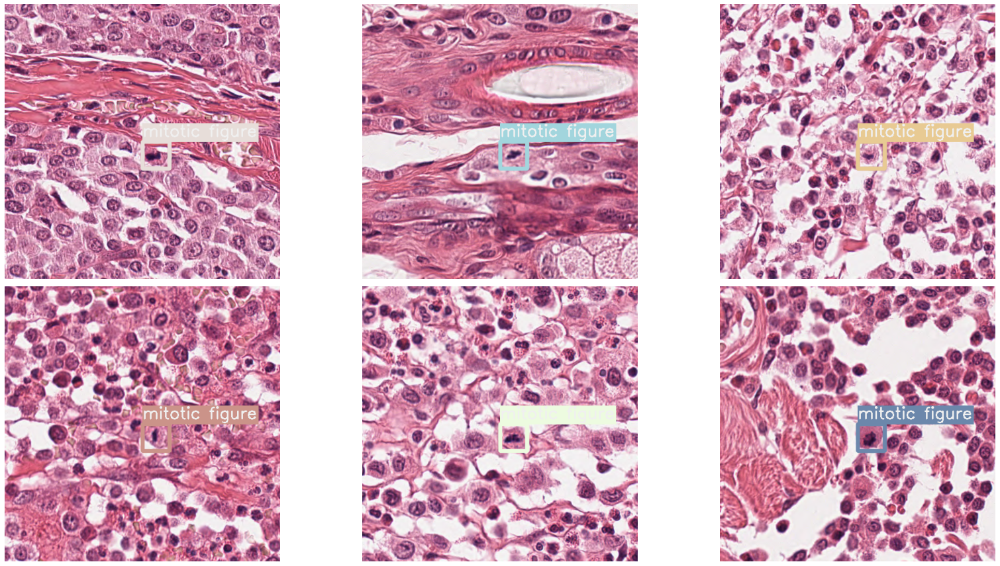

In [17]:
show_records(train_records[:6], ncols=3, class_map=class_map)

In [18]:
# Transforms
train_tfms = tfms.A.Adapter([*tfms.A.aug_tfms(size=size_trans, presize=size), tfms.A.Normalize()])
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(size_trans), tfms.A.Normalize()])

In [19]:
# Datasets
train_ds = Dataset(train_records, train_tfms)
valid_ds = Dataset(valid_records, valid_tfms)

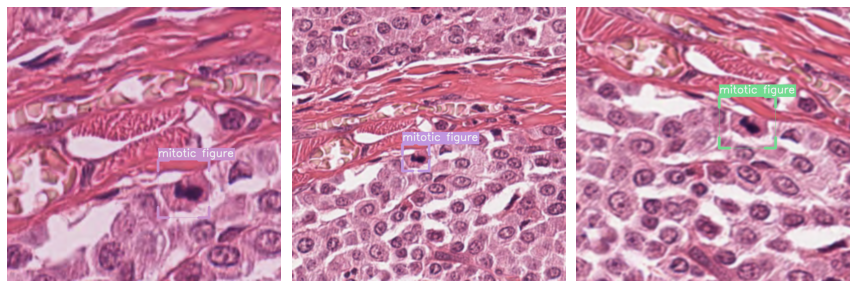

In [20]:
samples = [train_ds[0] for _ in range(3)]
show_samples(samples, ncols=3, class_map=class_map)

## DataLoader

In [21]:
# DataLoaders
train_dl = faster_rcnn.train_dl(train_ds, batch_size=params['batch_size'], num_workers=0, shuffle=True)
valid_dl = faster_rcnn.valid_dl(valid_ds, batch_size=params['batch_size'], num_workers=0, shuffle=False)

train_dl.batch_size

16

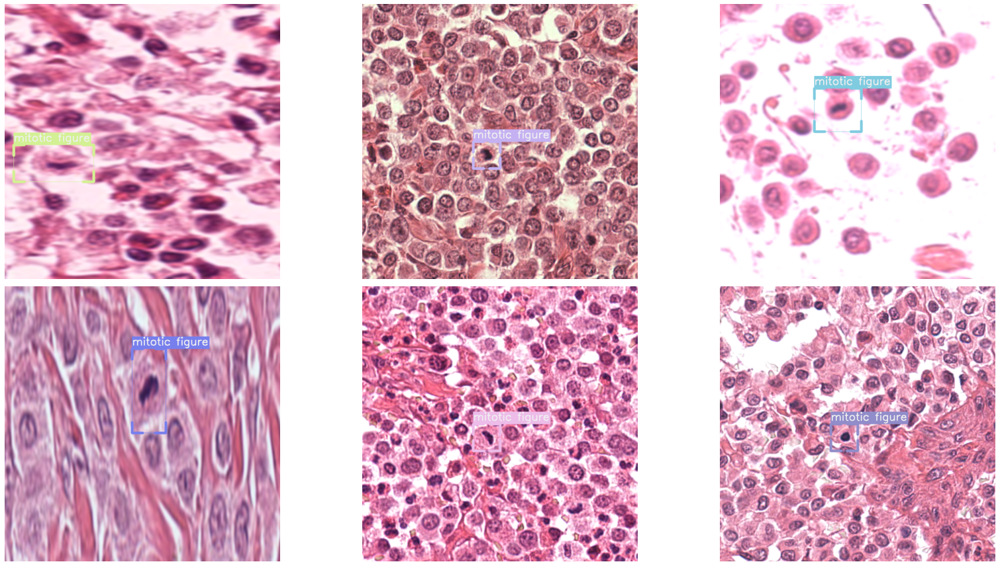

In [22]:
batch, samples = first(train_dl)
show_samples(samples[:6], class_map=class_map, ncols=3)

## Model & Metrics Setup

In [23]:
# Backbones
backbone = backbones.resnet_fpn.resnet18(pretrained=True)

Downloading: "https://download.pytorch.org/models/resnet18-5c106cde.pth" to /root/.cache/torch/hub/checkpoints/resnet18-5c106cde.pth


In [24]:
#FasterRCNN Config
model = faster_rcnn.model(backbone=backbone,
                           num_classes=len(class_map))

In [25]:
metrics = [COCOMetric(metric_type=COCOMetricType.bbox)]

In [63]:
#WanDB Config
wandb.init(project=params['project'], name=params['wandb_run_name'], config=params)
config = wandb.config

## Training


In [27]:
# learn = faster_rcnn.fastai.learner(dls=[train_dl, valid_dl], model=model, metrics=metrics)
learn = faster_rcnn.fastai.learner(dls=[train_dl, valid_dl], 
                                    model=model, 
                                    metrics=metrics,
                                    cbs=[WandbCallback(log_preds=False, log_dataset=False, log_model=False), SaveModelCallback()]
                                   )

WARNING  - Wandb quickfix implemented, for more info check issue #527 | icevision.models.torchvision_models.fastai.learner:rcnn_learner:39


SuggestedLRs(lr_min=0.0007585775572806596, lr_steep=5.248074739938602e-05)

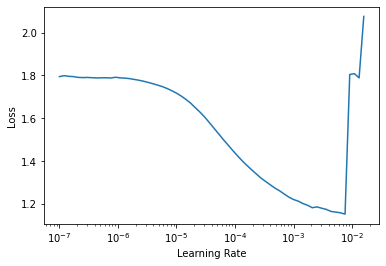

In [28]:
learn.freeze()
learn.lr_find()

In [ ]:
print(config.learning_rate)
print(config.epochs)

0.03
20


In [29]:
learn.fine_tune(10, 3e-4)
# learn.fine_tune(config.epochs, lr=config.learning_rate)

Could not gather input dimensions


epoch,train_loss,valid_loss,COCOMetric,time
0,1.376622,0.804139,0.000000,00:08


Better model found at epoch 0 with valid_loss value: 0.8041386604309082.
Could not gather input dimensions


epoch,train_loss,valid_loss,COCOMetric,time
0,0.787613,0.746487,0.000000,00:17
1,0.775517,0.649444,0.000000,00:10
2,0.733716,0.486124,0.000000,00:11
3,0.631461,0.170464,0.000000,00:11
4,0.517546,0.862566,0.000000,00:11
5,0.472926,0.167517,0.000000,00:11
6,0.424942,0.362785,0.000000,00:11
7,0.391427,0.430162,0.000000,00:11
8,0.366057,0.370741,0.000000,00:11
9,0.344293,0.357720,0.000000,00:11


Better model found at epoch 0 with valid_loss value: 0.7464873790740967.
Better model found at epoch 1 with valid_loss value: 0.6494435667991638.
Better model found at epoch 2 with valid_loss value: 0.48612385988235474.
Better model found at epoch 3 with valid_loss value: 0.1704639345407486.
Better model found at epoch 5 with valid_loss value: 0.16751675307750702.


SuggestedLRs(lr_min=0.00010000000474974513, lr_steep=6.309573450380412e-07)

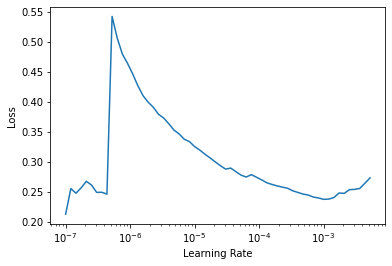

In [30]:
learn.freeze()
learn.lr_find()

In [31]:
learn.unfreeze()
learn.fine_tune(10, 1e-6)

Could not gather input dimensions


epoch,train_loss,valid_loss,COCOMetric,time
0,0.224464,0.168092,0.000000,00:07


Better model found at epoch 0 with valid_loss value: 0.16809159517288208.
Could not gather input dimensions


epoch,train_loss,valid_loss,COCOMetric,time
0,0.247886,0.167034,0.000000,00:11
1,0.244127,0.165336,0.000000,00:11
2,0.247694,0.164345,0.000000,00:11
3,0.249603,0.162970,0.000000,00:10
4,0.243725,0.161859,0.000000,00:10
5,0.259171,0.161481,0.000000,00:10
6,0.247320,0.160096,0.000000,00:10
7,0.242347,0.159571,0.000000,00:11
8,0.235699,0.160239,0.000000,00:11
9,0.231344,0.161340,0.000000,00:11


Better model found at epoch 0 with valid_loss value: 0.16703379154205322.
Better model found at epoch 1 with valid_loss value: 0.1653357446193695.
Better model found at epoch 2 with valid_loss value: 0.16434532403945923.
Better model found at epoch 3 with valid_loss value: 0.1629696786403656.
Better model found at epoch 4 with valid_loss value: 0.16185884177684784.
Better model found at epoch 5 with valid_loss value: 0.16148138046264648.
Better model found at epoch 6 with valid_loss value: 0.16009560227394104.
Better model found at epoch 7 with valid_loss value: 0.15957124531269073.


## Visualize Predictions

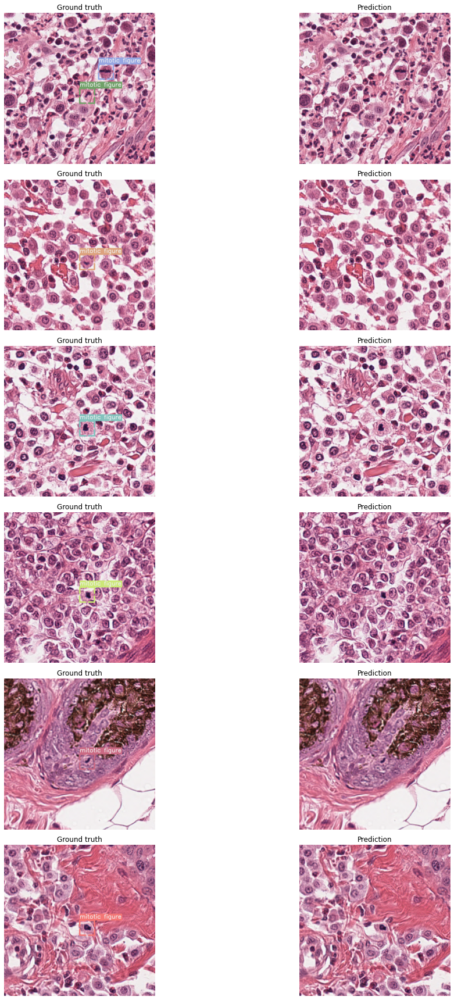

In [32]:
faster_rcnn.show_results(model, valid_ds, class_map=class_map)

In [33]:
valid_test_dl = faster_rcnn.infer_dl(valid_ds, batch_size=params['batch_size'])
samples, preds = faster_rcnn.predict_dl(model, valid_test_dl)

In [34]:
wandb_images = wandb_img_preds(samples[:10], preds[:10], class_map, add_ground_truth=True) 

In [35]:
wandb.log({"Validation Images Prediction-" + str(size_trans) + "px": wandb_images})
# wandb.join()

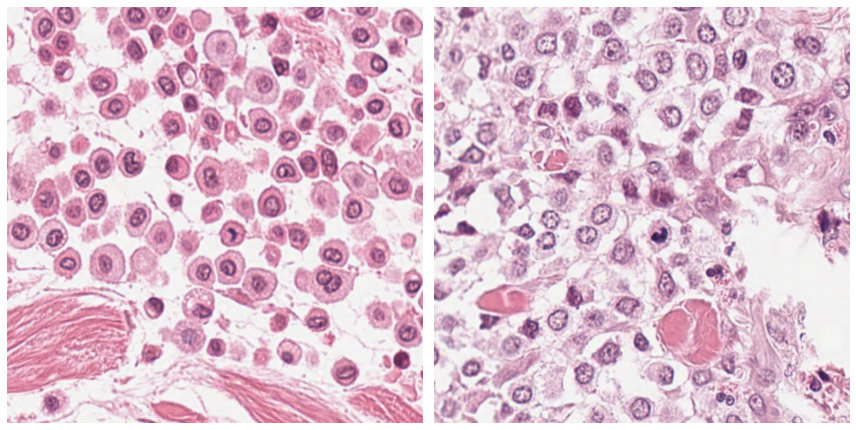

In [36]:
# Show inference on validation dataset
imgs = [sample["img"] for sample in samples]
imgs=imgs[:2]
show_preds(
    imgs,
    preds=preds[:2],
    class_map=class_map,
    denormalize_fn=denormalize_imagenet,
    ncols=2,
)

In [37]:
#Save model weights
model_saved = params['wandb_run_name'] + '-ep30' + '.pth'
torch.save(model.state_dict(), data_dir/model_saved)

## Prediction from Saved Model

In [38]:
print(class_map)

<ClassMap: {'background': 0, 'unkown': 1, 'mitotic figure': 2}>


In [52]:
data_dir_test = Path('./WSI_PATCHES/MitosisTest_512px_2ds')
# data_dir_test = Path('./WSI_PATCHES/MitosisTest_1024px_2ds')
# data_dir_test = Path('./WSI_PATCHES/MitosisTest_768px_2ds')
size_test = '768px'

In [53]:
print('size=',size)
print('size_trans=',size_trans)

size= 512
size_trans= 768


In [54]:
parser_tst = parsers.coco(annotations_file=data_dir_test / 'Coco.json',
                     img_dir=data_dir_test / 'patches',
                     mask=False)

In [55]:
test_records = parser_tst.parse(data_splitter=SingleSplitSplitter())
test_records = test_records[0]
len(test_records)

INFO     - Autofixing records | icevision.parsers.parser:parse:124


2

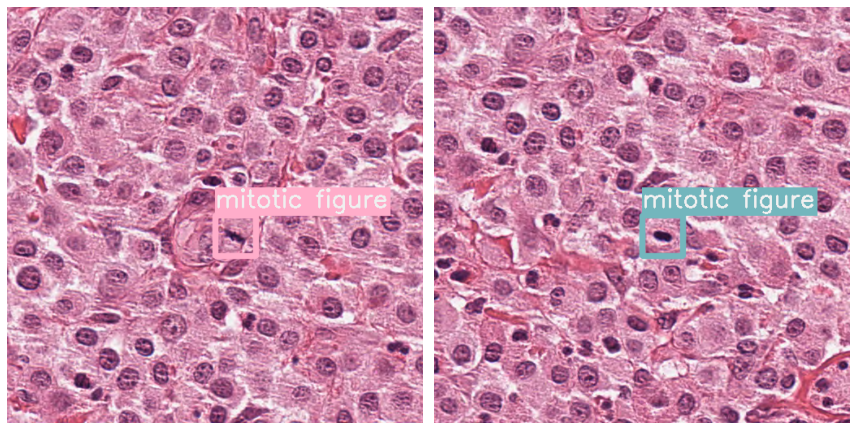

In [56]:
show_records(test_records, ncols=2, class_map=class_map)

In [57]:
test_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(size), tfms.A.Normalize()])
test_infer_ds = Dataset(test_records, test_tfms)

In [58]:
#Load Model
model2 = faster_rcnn.model(backbone=backbone, num_classes=len(class_map))
state_dict = torch.load(data_dir/model_saved)
model2.load_state_dict(state_dict)

<All keys matched successfully>

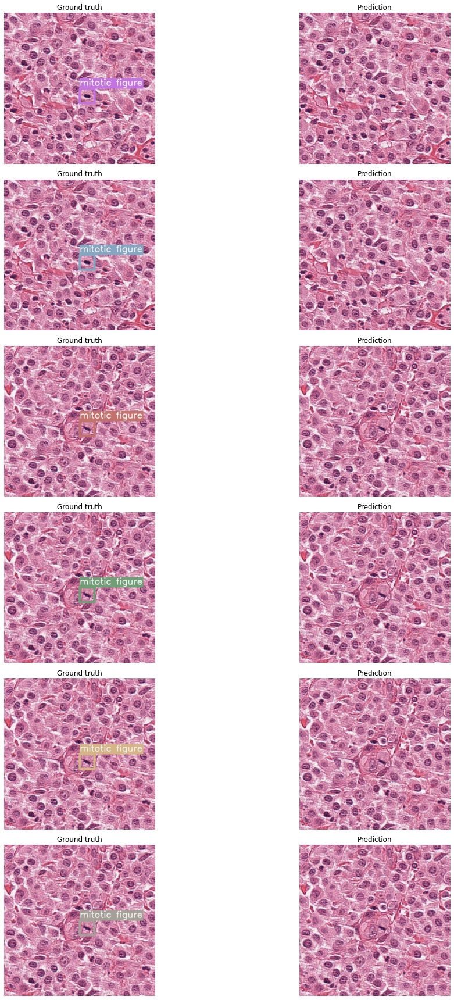

In [59]:
faster_rcnn.show_results(model, test_infer_ds, class_map=class_map)

In [60]:
infer_dl = faster_rcnn.infer_dl(test_infer_ds, batch_size=1)
samples_inf, preds_inf = faster_rcnn.predict_dl(model=model2, infer_dl=infer_dl)

RuntimeError: ignored

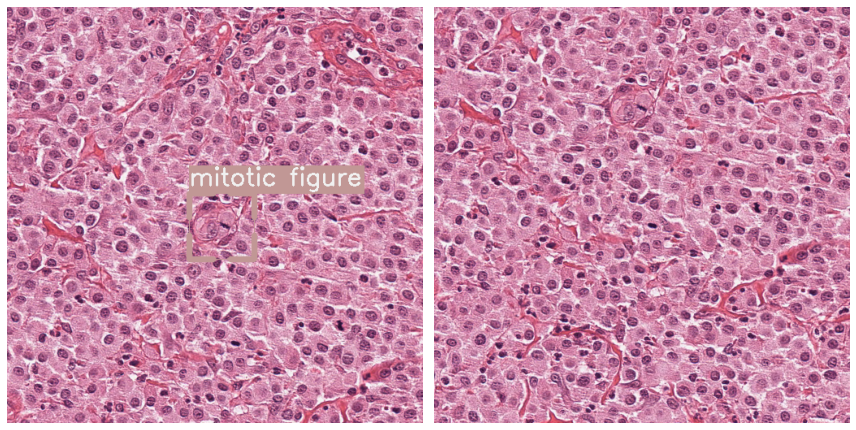

In [ ]:
# Show samples
imgs = [sample["img"] for sample in samples_inf]
imgs=imgs[:4]
show_preds(
    imgs,
    preds=preds_inf[:4],
    class_map=class_map,
    denormalize_fn=denormalize_imagenet,
    ncols=2,
)

In [ ]:
# wandb_images_test = wandb_img_preds(samples_inf, preds_inf, class_map, add_ground_truth=False) 

In [62]:
# wandb.log({"Test Image Predictions-" + size_test: wandb_images_test})
wandb.join()